# Problem statement:

## Anime sketch colorization

### Description
"sketch" of cartoon images of various characters from cartoon web_series is given with its source image i.e. colorful image.

### Task

The task is to generate a compatible colored anime image from a given black-and-white anime sketch with help of Generative Adversarial Networks(GANS).

# Refered to complete this project
1)research papers: https://arxiv.org/pdf/1705.01908.pdf,               https://arxiv.org/pdf/1611.07004.pdf

2)Gan Hacks:- https://github.com/soumith/ganhacks

3)https://affinelayer.com/pix2pix/

4)https://medium.com/@jonathan_hui/gan-gan-series-2d279f906e7b

5)https://phillipi.github.io/pix2pix/

## Data

Source :- https://www.kaggle.com/wuhecong/danbooru-sketch-pair-128x

## Type of ML Problem
-The problem is related with Images, So Deep Learning is used to solve the problem.

-We have to generate the colorful image from sketch, the Probem is of GAN (Generative Adverserial Network).

-The problem is different from Vanilla GAN, here we have to generate images according to the sketch provided, SO the problem is related with Conditional GAN.

### Why Conditional Gan

-A limitation of a GAN model is that it may generate a random image from the domain. There is a relationship between points in the latent space to the generated images, but this relationship is complex and hard to map.

-A GAN can be trained in such a way that both the generator and the discriminator models are conditioned on the class label. This means that when the trained generator model is used as a standalone model to generate images in the domain, images of a given type, or class label, can be generated.

-There are two motivations for making use of the class label information in a GAN model.

    1)Improve the GAN.
    2)Targeted Image Generation


## Architecture of Conditional Gan (Pix2Pix model)

<img src="image.png">

### Data Information

-There is total of approx 10 GB data.

-folder named "danbooru-sketch-pair-128x" contains two folder "color", "gray".

-folder named "gray" contains 1 GB of b/w cartoon which is nothing of use for us, so I removed it manually.

-content of folder named "color" is copied under "danbooru-sketch-pair-128x" and color folder is removed manually.

note: in "color" folder there are two sub folders called "sketch" and "src" which contain sketch image and colorful images respectively. we have approx 100k data of training, i have randomly sampled 5K sample for test purpose and stored in train.zip and test.zip file and imported in google colab

## Loading libraries and data:

In [28]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [29]:
!ls "/content/drive/My Drive/Colab Notebooks/anime/"

custom	test_set.zip  train_set.zip  Untitled0.ipynb


In [3]:
!unzip 'drive/My Drive/Colab Notebooks/anime/train_set.zip'

Streaming output truncated to the last 5000 lines.
  inflating: __MACOSX/train_set/src/._2720107.png  
  inflating: train_set/src/1879107.png  
  inflating: __MACOSX/train_set/src/._1879107.png  
  inflating: train_set/src/1354121.png  
  inflating: __MACOSX/train_set/src/._1354121.png  
  inflating: train_set/src/347119.png  
  inflating: __MACOSX/train_set/src/._347119.png  
  inflating: train_set/src/1383137.png  
  inflating: __MACOSX/train_set/src/._1383137.png  
  inflating: train_set/src/2515138.png  
  inflating: __MACOSX/train_set/src/._2515138.png  
  inflating: train_set/src/496057.png  
  inflating: __MACOSX/train_set/src/._496057.png  
  inflating: train_set/src/2704099.png  
  inflating: __MACOSX/train_set/src/._2704099.png  
  inflating: train_set/src/1192096.png  
  inflating: __MACOSX/train_set/src/._1192096.png  
  inflating: train_set/src/569097.png  
  inflating: __MACOSX/train_set/src/._569097.png  
  inflating: train_set/src/219059.png  
  inflating: __MACOSX/trai

In [23]:
!unzip 'drive/My Drive/Colab Notebooks/anime/test_set.zip'

Streaming output truncated to the last 5000 lines.
  inflating: __MACOSX/test_set/src/._311105.png  
  inflating: test_set/src/14099.png  
  inflating: __MACOSX/test_set/src/._14099.png  
  inflating: test_set/src/1536028.png  
  inflating: __MACOSX/test_set/src/._1536028.png  
  inflating: test_set/src/2045013.png  
  inflating: __MACOSX/test_set/src/._2045013.png  
  inflating: test_set/src/1577074.png  
  inflating: __MACOSX/test_set/src/._1577074.png  
  inflating: test_set/src/2691019.png  
  inflating: __MACOSX/test_set/src/._2691019.png  
  inflating: test_set/src/2473030.png  
  inflating: __MACOSX/test_set/src/._2473030.png  
  inflating: test_set/src/2462129.png  
  inflating: __MACOSX/test_set/src/._2462129.png  
  inflating: test_set/src/2095030.png  
  inflating: __MACOSX/test_set/src/._2095030.png  
  inflating: test_set/src/360065.png  
  inflating: __MACOSX/test_set/src/._360065.png  
  inflating: test_set/src/561120.png  
  inflating: __MACOSX/test_set/src/._561120.png

In [4]:
# importing library
import os
import matplotlib.pyplot as plt
import numpy as np
import shutil
import random
from IPython import display
import math
import tensorflow as tf

import tensorflow.keras.backend as K
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.initializers import RandomNormal
from tensorflow.keras.models import Model
from tensorflow.keras import Input
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.layers import Conv2D,Dropout,Conv2DTranspose,BatchNormalization,LeakyReLU,Concatenate,Activation,Dense
from tensorflow.keras.layers import Reshape, GlobalAveragePooling2D, ReLU
from tensorflow.keras.models import load_model
from PIL import ImageFile,Image
ImageFile.LOAD_TRUNCATED_IMAGES = True

from datetime import datetime
import glob



# providing a same seed to all random generators

random_seed = 100

np.random.seed(random_seed)
random.seed(random_seed)
tf.random.set_seed(random_seed)

In [5]:
tf.compat.v1.disable_eager_execution()

## Discriminator

-we are trying to implement architecture mentioned in the research paper.

-Image-to-Image Translation with Conditional Adversarial Networks, 2016.:- https://arxiv.org/pdf/1611.07004.pdf (check 6.0 Appendix)

## Architecture of PatchGAN( type of Discriminator)

<img src="image1.png">

Note: our dimensions differ from the given architecture as we are using input image of dimension (128x128x3) 

### Why PatchGAN

-The PatchGAN / Markovian discriminator works by classifying individual (N x N) patches in the image as “real vs. fake”, opposed to classifying the entire image as “real vs. fake”.  

-this enforces more constraints that encourage sharp high-frequency detail. Additionally, the PatchGAN has fewer parameters and runs faster than classifying the entire image

<img src="image2.png" >

-Effective Recpetive Field: It is the cross-section of Input Image which is seen by each output of last convolution layer.

-In research paper they are using (256x256x3) images and they found that (70x70) effective receptive field is working good

-We will also use (70x70) effective receptive field.

-We have to back treverse to find the effective receptive field of a CNN model.

-formula is:-

  - receptive field = (output_size - 1) * stride_size + kernel_size
  
for more information: https://medium.com/@sahiltinky94/understanding-patchgan-9f3c8380c207

In [6]:
def discriminator(img_shape):
    '''
    This function takes the shape of image as input and returns the discriminator as PatchGAN.
    
    Takes the sketch and target image/generated colored image from generator with the values in the range [-1, 1] 
    and outputs the probability of being real/fake in the range [0, 1].
    '''
    
    # source image 
    source_image = Input(shape=img_shape)
    # target image
    target_image = Input(shape=img_shape)
    
    # defining kernel_initializer
    k_in = RandomNormal(stddev=0.02)
    
    # concatenating images
    con = Concatenate()([source_image, target_image])
    
    dis = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(con) #64x64x64
    dis = LeakyReLU(alpha=0.2)(dis)   
    
    dis = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(dis) #32x32x128
    dis = BatchNormalization()(dis)
    dis = LeakyReLU(alpha=0.2)(dis)
   

    dis = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(dis) #16x16x256
    dis = BatchNormalization()(dis)
    dis = LeakyReLU(alpha=0.2)(dis)
    
    
    # second last layer
    dis = Conv2D(512, (2,2), kernel_initializer=k_in)(dis) #15x15x512
    dis = BatchNormalization()(dis)
    dis = LeakyReLU(alpha=0.2)(dis)
    
    # last layer
    out = Conv2D(1, (2,2), activation = "sigmoid", padding='valid', kernel_initializer=k_in)(dis) #14x14x1
    
    final_out = GlobalAveragePooling2D()(out)
    
    # defining model
    model = Model([source_image, target_image], final_out)
    model.compile(loss='binary_crossentropy', optimizer=Adam(lr=0.0002, beta_1=0.5), loss_weights=[0.5])
    return model
              

# checking model
image_shape = (128,128,3)
model = discriminator(image_shape)

# summary
model.summary()

Model: "functional_1"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
concatenate (Concatenate)       (None, 128, 128, 6)  0           input_1[0][0]                    
                                                                 input_2[0][0]                    
__________________________________________________________________________________________________
conv2d (Conv2D)                 (None, 64, 64, 64)   6208        concatenate[0][0]     

## U-Net (Generator) 

<img src="image3.png" >

## Architecture

<img src="image4.png">

-In research paper they are using (256x256x3) image with stride of (2x2) in each layer which will reduce size to 1 in bottleneck

-But we have (128x128x3) so we will discard one layer from each endocer and decoder

### Why U-Net

-The reason it is able to localise and distinguish borders is by doing classification on every pixel, so the input and output share the same size. 

-The U-Net is similar to ResNets in the way that information from earlier layers are integrated into later layers. The U-Net skip connections are also interesting because they do not require any resizing, projections etc. since the spatial resolution of the layers being connected already match each other.

In [7]:
def generator(img_shape):
    
    '''
    This function takes the shape of image as input and returns the generator model as U-net architecture.
    
    This function defines the generator part of the GAN with given input shape 
    using the Convolution and Convolution Transpose Blocks defined before.
      
    Takes the sketch input with values in the range [-1, 1] and generates the colored image of the same.
    
    why Convolution Transpose Blocks:--
    First and foremost, it is possible to use traditional interpolation techniques to make your image larger. 
    For example, you could use bicubic or bilinear interpolation to achieve the result you’re interested in. 
    However, they’re not too flexible: they simply compute an estimate of the interpolated pixel values based on their surroundings. 
    In the case of making images larger without losing a sense of detail, 
    we might be interested in a different approach – one where the means of interpolation is learnt based on the target
    
    for more info:
    https://www.machinecurve.com/index.php/2019/09/29/understanding-transposed-convolutions/

    '''
    
    k_in = RandomNormal(stddev=0.02)
    
    # image input
    sketch_img = Input(shape=img_shape)
    
    # encoder
    gen_en1 = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(sketch_img)
    gen_en1 = LeakyReLU(alpha=0.2)(gen_en1)
    
    gen_en2 = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_en1)
    gen_en2 = BatchNormalization()(gen_en2, training=True)
    gen_en2 = LeakyReLU(alpha=0.2)(gen_en2)
    
    gen_en3 = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_en2)
    gen_en3 = BatchNormalization()(gen_en3, training=True)
    gen_en3 = LeakyReLU(alpha=0.2)(gen_en3)
    
    gen_en4 = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_en3)
    gen_en4 = BatchNormalization()(gen_en4, training=True)
    gen_en4 = LeakyReLU(alpha=0.2)(gen_en4)
    
    gen_en5 = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_en4)
    gen_en5 = BatchNormalization()(gen_en5, training=True)
    gen_en5 = LeakyReLU(alpha=0.2)(gen_en5)
    
    gen_en6 = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_en5)
    gen_en6 = BatchNormalization()(gen_en6, training=True)
    gen_en6 = LeakyReLU(alpha=0.2)(gen_en6)
    
    
    # bottleneck
    bttl = Conv2D(512, (4,4), strides=(2,2), padding='same',activation="relu", kernel_initializer=k_in)(gen_en6)
    
    # decoder
    gen_de1 = Conv2DTranspose(512, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(bttl)
    gen_de1 = BatchNormalization()(gen_de1, training=True)
    gen_de1 = Dropout(0.5)(gen_de1, training=True)
    gen_de1 = Concatenate()([gen_de1, gen_en6])
    gen_de1 = Activation('relu')(gen_de1)
    
    gen_de2 = Conv2DTranspose(512, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_de1)
    gen_de2 = BatchNormalization()(gen_de2, training=True)
    gen_de2 = Dropout(0.5)(gen_de2, training=True)
    gen_de2 = Concatenate()([gen_de2, gen_en5])
    gen_de2 = Activation('relu')(gen_de2)
    
    gen_de3 = Conv2DTranspose(512, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_de2)
    gen_de3 = BatchNormalization()(gen_de3, training=True)
    gen_de3 = Dropout(0.5)(gen_de3, training=True)
    gen_de3 = Concatenate()([gen_de3, gen_en4])
    gen_de3 = Activation('relu')(gen_de3)
    
    gen_de4 = Conv2DTranspose(256, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_de3)
    gen_de4 = BatchNormalization()(gen_de4, training=True)
    gen_de4 = Concatenate()([gen_de4, gen_en3])
    gen_de4 = Activation('relu')(gen_de4)
    
    gen_de5 = Conv2DTranspose(128, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_de4)
    gen_de5 = BatchNormalization()(gen_de5, training=True)
    gen_de5 = Concatenate()([gen_de5, gen_en2])
    gen_de5 = Activation('relu')(gen_de5)
    
    gen_de6 = Conv2DTranspose(64, (4,4), strides=(2,2), padding='same', kernel_initializer=k_in)(gen_de5)
    gen_de6 = BatchNormalization()(gen_de6, training=True)
    gen_de6 = Concatenate()([gen_de6, gen_en1])
    gen_de6 = Activation('relu')(gen_de6)
    
    
    # output
    gen_col_img = Conv2DTranspose(3, (4,4), strides=(2,2), activation= 'tanh',padding='same', kernel_initializer=k_in)(gen_de6)
    
    # define model
    model = Model(sketch_img, gen_col_img)
    return model

# checking model
image_shape = (128,128,3)
model = generator(image_shape)

# summary
model.summary()

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv2d_5 (Conv2D)               (None, 64, 64, 64)   3136        input_3[0][0]                    
__________________________________________________________________________________________________
leaky_re_lu_4 (LeakyReLU)       (None, 64, 64, 64)   0           conv2d_5[0][0]                   
__________________________________________________________________________________________________
conv2d_6 (Conv2D)               (None, 32, 32, 128)  131200      leaky_re_lu_4[0][0]              
_______________________________________________________________________________________

In [8]:
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.applications.vgg16 import VGG16

vgg16 = VGG16(weights='imagenet')

553467904/553467096 [==============================] - 3s 0us/step


In [9]:
def pixel_loss(true, pred):
    '''
    parameter "true" is real color image, parameter "pred" is generated image,
    For each pixel of real color image and generated image it returns the average 
    of distance between them.
    
    A loss for getting proper images by comparing each pixel.
    Custom loss for Pixel2Pixel level translation so that colors don't 
    come out the edges of generated images.
    '''
    
    def p_loss(y_true, y_pred):
    
        return K.mean( K.abs( true - pred ) )
    return p_loss

def binaryCrossEntropy(from_logits=False):
    '''
    A loss for checking if generated image is similar to real colored image.

    A Simple Binary cross entropy for back propagating the error made by the discriminator to the generator.

    '''
    def finalBCELoss(y_true, y_pred):
        return  K.mean(K.binary_crossentropy(y_true, y_pred, from_logits=from_logits), axis=-1)
    
    return finalBCELoss

def featureLevel_loss(y, g):
    '''
    A loss for features extracted from 4th layer of VGG16.

    Custom loss for extracting high level features of the target colored and generated colored images.
    Taking the difference of VGG16 layer-4 output features as per reference paper.

    '''
    def finalFLoss(y_true, y_pred):
        return K.mean( K.sqrt( K.sum( K.square( y - g ) ) ) )
    return finalFLoss

def totalVariation_loss(g):
    '''
    A loss for smoothness and to remove noise from the output image.

    Custom loss for getting similar colors of trained data like skin, hair. 
    '''
    def finalTVLoss( y_pred):
        return K.abs( K.sqrt( K.sum(K.square(g[:, 1:, :, :] - g[:, :-1, :, :])) + K.sum(K.square(g[:, :, 1:, :] - g[:, :, :-1, :]))))
    return finalTVLoss





In [10]:
# Extracting intermediate layer features keras : https://keras.io/applications/#vgg16
vgg_1 = Model(inputs=vgg16.input, outputs=ReLU()(vgg16.get_layer('block2_conv2').output))
vgg_2 = Model(inputs=vgg16.input, outputs=ReLU()(vgg16.get_layer('block2_conv2').output))

pixel_loss_weight = 100
variation_loss_weight = .0001
feature_loss_weight = .01


def define_gan(g_model, d_model, image_shape):
    def gan_loss(y_true, y_pred):
        '''
        returns the loss function of GAN.
        '''
        return tf.keras.losses.binary_crossentropy(y_true, y_pred) + pixel_loss_weight * pixel_loss_out(y_true, y_pred) +\
               variation_loss_weight * totalVariationLoss(y_pred) + feature_loss_weight * featureLevelLoss(y_true, y_pred)
    
    
    d_model.trainable = False
    
    #Generator
    sketch_image = Input(image_shape)
    gen_output = g_model([sketch_image])
    
    #Discriminator
    dis_output = d_model([sketch_image, gen_output])
    
    #Pixel Loss
    color_image = Input(image_shape)
    pixel_loss_out = pixel_loss(color_image, gen_output)
    
    #Variation Loss
    totalVariationLoss = totalVariation_loss(gen_output)
    
    #Feature Loss
    vgg1_out = vgg_1([tf.image.resize(color_image, (128,128), tf.image.ResizeMethod.BILINEAR)])
    vgg2_out = vgg_2([tf.image.resize(gen_output, (128,128), tf.image.ResizeMethod.BILINEAR)])
    
    featureLevelLoss = featureLevel_loss(vgg1_out,vgg2_out)
    
    crossEntropyLoss = binaryCrossEntropy()
    
    #Final Model
    model = Model(inputs=[sketch_image, color_image], outputs=dis_output)
    
    #Single output multiple loss functions in keras : https://stackoverflow.com/a/51705573/9079093
    model.compile(loss=gan_loss,optimizer=Adam(lr = 0.0005, beta_1 = 0.5))
    
                                             
    return model

image_shape = (128,128,3)

g_model = generator(image_shape)

d_model = discriminator(image_shape)

gan_model = define_gan(g_model, d_model,image_shape)
gan_model.summary()

Model: "functional_13"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_8 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
functional_9 (Functional)       (None, 128, 128, 3)  41841283    input_8[0][0]                    
__________________________________________________________________________________________________
input_9 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
functional_11 (Functional)      (None, 1)            1192385     input_8[0][0]                    
                                                                 functional_9[0][0]   

# Loading Data From Directory

In [11]:
color_img_path = glob.glob('train_set/src/*.png')
sketch_path = glob.glob('train_set/sketch/*.png')

color_image_path = np.array(color_img_path)
sketch_path = np.array(sketch_path)

total_img = color_image_path.shape[0]

In [12]:
print(total_img)

99660


In [14]:
def generate_real_images(sketch_path, color_image_path, n_sample):
    '''
    This function will read the data from paths provided and return the 
    actual sketch-color pair along with class label as "1" which denotes real images.
    '''
    
    index = np.random.randint(0, total_img, n_sample)
    sketch_image = []
    color_image = []
  
    for sketch, img in zip(sketch_path[index], color_image_path[index]):
        sketch_image.append(np.array(Image.open(sketch).convert('RGB')))
        color_image.append(np.array(Image.open(img).convert('RGB')))
  
    # Normalizing the values to be between [-1, 1].
    sketch_image = (np.array(sketch_image, dtype='float32')/127.5 - 1)
    color_image = (np.array(color_image, dtype='float32')/127.5 - 1)
    
    y_real = np.ones((n_sample,1))

    return sketch_image, color_image, y_real

def generate_fake_images(g_model, sketch_path, n_sample , seed_sketch=None, seed_color=None):
    '''
    This function will read only sketch data, and generate fake data using generator and return
    fake sketch-color pair along with class label as "0" which denotes fake images.
    '''
    
    sketch_image = []
    fake_color_image = []
    
    if seed_sketch is not None and seed_color is not None:
        fake_color_image = g_model.predict(seed_sketch)
        return seed_color, fake_color_image
    
    else:
        index = np.random.randint(0, total_img, n_sample)

        for sketch in sketch_path[index]:
            sketch_image.append(np.array(Image.open(sketch).convert('RGB')))
        
        # Normalizing the values to be between [-1, 1].
        sketch_image = (np.array(sketch_image, dtype='float32')/127.5 - 1)

        fake_color_image = g_model.predict(sketch_image)
        y_fake = np.zeros((n_sample, 1))

        return sketch_image, fake_color_image, y_fake
        
    

def summary_save_plot(epoch, g_model, sketch_path, seed_sketch, seed_color, n_sample=8):
    '''
    This Function will plot the real color image along with generated color image, and saves the plot
    '''

    real_color_image, fake_color_image = generate_fake_images(g_model, sketch_path, n_sample, seed_sketch=seed_sketch,\
                                                               seed_color=seed_color)

    row,col = 4,4
    
    gen_imgs = np.concatenate([fake_color_image, real_color_image])
    
    # Rescaling images to [0 - 1]
    gen_imgs = 0.5 * gen_imgs + 0.5

    titles = ['Generated','Generated','Original','Original']
    
    fig, axs = plt.subplots(row, col, figsize=(10,10))
    cnt = 0
    for i in range(row):
        for j in range(col):
            axs[i,j].imshow(gen_imgs[cnt])
            axs[i,j].set_title(titles[i])
            axs[i,j].axis('off')
            cnt += 1
    if not os.path.isdir('test_result'):
        os.makedirs('test_result')
    fig.savefig("test_result/{}.png".format(epoch))
    plt.show()
    plt.close()


def save_model(epoch,g_model):
    '''
        Saves the Generator Model
    '''
    # saving models after each epoch
    if not os.path.isdir('save_model/generator'):
        os.makedirs('save_model/generator')
        
    g_model.save('save_model/generator/generator_{}.h5'.format(epoch))

In [15]:
def write_log(callback, name, loss, batch_no, flush=False):
    '''
        Defining manual callback
    '''
    writer = tf.summary.create_file_writer(callback)

    with writer.as_default():

              tf.summary.scalar(name, loss,step=batch_no)

              writer.flush()

In [40]:
!ls "

test_result


In [16]:
def train(g_model, d_model, gan_model, sketch_path, color_image_path, seed_sketch, seed_color, n_epoch, n_batch, initial_epoch):
    '''
    This function train the model over randomly sampled batch of real images 
    and fake images. Both discriminator and generator is trained alternatively.
    Results are displayed and generator model is saved after each epoch.
    '''
    batch_per_epoch = int(total_img / n_batch)
    half_batch = int(n_batch / 2) # this is created for discriminator as er are calling it twice so we pass half data.
    for i in range(initial_epoch, n_epoch):
        start2 = datetime.now()
        generator_loss = []
        discriminator_loss = []
    
        for j in range(batch_per_epoch):
            
            # discriminator model needs to be called twice
            if not j%2: # train only for odd value of j, to avoid over training
                
                # Discriminator real loss 
                real_sketch, real_col_image, y_real = generate_real_images(sketch_path, color_image_path, half_batch)
                d_loss_real = d_model.train_on_batch([real_sketch, real_col_image], y_real * .9)

            if not j%3: # train only when j is multiple of 3. to avoid over training
                
                # Discriminator fake loss 
                fake_sketch, fake_col_image, y_fake = generate_fake_images(g_model, sketch_path, half_batch)
                d_loss_fake = d_model.train_on_batch([fake_sketch, fake_col_image], y_fake)
                
            total_dis_loss = d_loss_real + d_loss_fake

            #GAN loss
            real_sketch, real_col_image, y_real = generate_real_images(sketch_path, color_image_path, n_batch)
            gan_loss = gan_model.train_on_batch([real_sketch, real_col_image], y_real)
            
            # saving loss per epoch
            discriminator_loss.append(total_dis_loss)
            generator_loss.append(gan_loss)
            #j1=j
            #d_loss_real1=d_loss_real
            #d_loss_fake1=d_loss_fake
            #gan_loss1=gan_loss
            
            # output after 100 iter
            if not j % 100:
                print("epoch>{}, {}/{}, d_real={:.3f}, d_fake={:.3f}, gan={:.3f}".format(i+1, j+1, batch_per_epoch,\
                                                                                         d_loss_real,d_loss_fake, gan_loss))
            
        
        # writing to tensorboard
        write_log("tensorbaord/discriminator/", 'discriminator_loss', np.mean(discriminator_loss), i+1, (i+1)%3==0)
        write_log("tensorbaord/generator/", 'generator_loss', np.mean(generator_loss), i+1, (i+1)%3==0)
        
        #Summary after every epoch.
        display.clear_output(True)
        print('Time for epoch {} : {}'.format(i+1, datetime.now()-start2))
        print('epoch>{}, {}/{}, d_real={:.3f}, d_fake={:.3f}, gan={:.3f}'.format(i+1, j+1, batch_per_epoch, d_loss_real,\
                                                                       d_loss_fake, gan_loss))
        
        summary_save_plot(i, g_model, sketch_path, seed_sketch,seed_color, seed_color.shape[0])
        
        # saving model
        save_model(i,g_model)
        #i1=i
    
    # Final summary
    display.clear_output(True)
    print('epoch>{}, {}/{}, d_real={:.3f}, d_fake={:.3f}, gan={:.3f}'.format(i+1, j+1, batch_per_epoch, d_loss_real,\
                                                                             d_loss_fake, gan_loss))
    summary_save_plot(i, g_model, sketch_path, seed_sketch, seed_color, seed_color.shape[0])
    

In [17]:
# sampling data for the 
seed_sketch = []
seed_color = []
index = np.random.randint(0, total_img, 8)

for sketch, image in zip(sketch_path[index], color_image_path[index]):
    seed_sketch.append(np.array(Image.open(sketch).convert('RGB')))
    seed_color.append(np.array(Image.open(image).convert('RGB')))

#Normalizing the values to be between [-1, 1].
seed_sketch = (np.array(seed_sketch, dtype='float32')/127.5 - 1)
seed_color = (np.array(seed_color, dtype='float32')/127.5 - 1)

# Training trail -1

epoch>20, 346/346, d_real=0.163, d_fake=0.001, gan=681.917


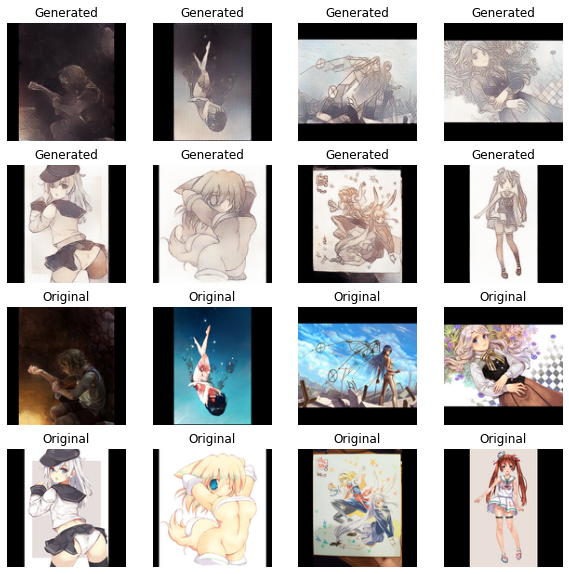

In [18]:
#Training
train(g_model, d_model, gan_model, sketch_path, color_image_path, seed_sketch, seed_color, n_epoch=20, n_batch=288, initial_epoch=0)

epoch>40, 346/346, d_real=0.163, d_fake=0.000, gan=631.514


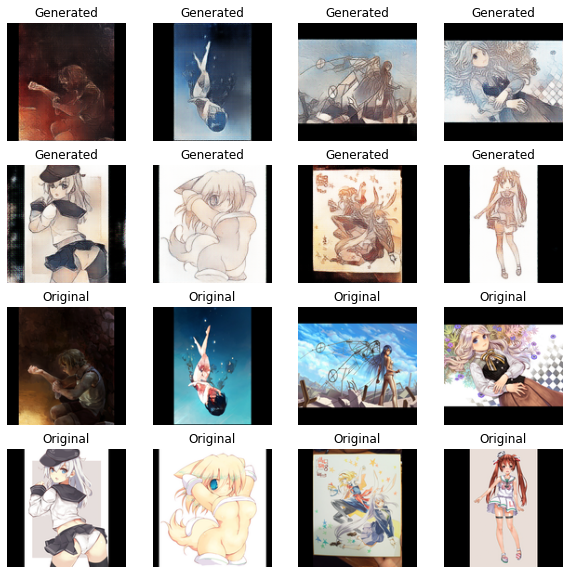

In [19]:
#Training
train(g_model, d_model, gan_model, sketch_path, color_image_path, seed_sketch, seed_color, n_epoch=40, n_batch=288, initial_epoch=20)

# Training trail-2

epoch>20, 346/346, d_real=0.164, d_fake=0.000, gan=679.599


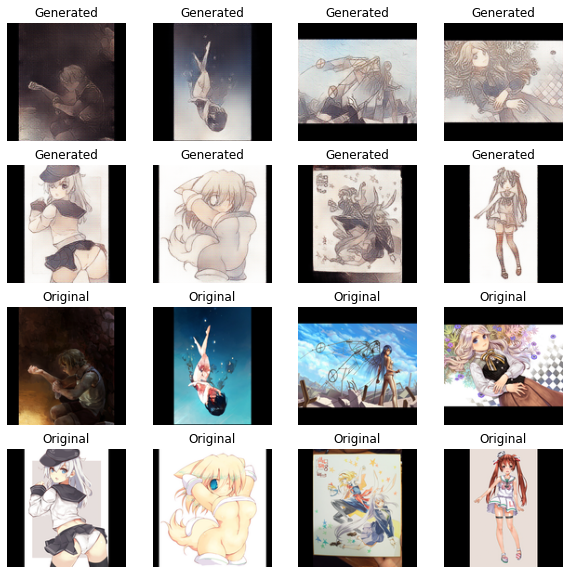

In [ ]:
#Training
train(g_model, d_model, gan_model, sketch_path, color_image_path, seed_sketch, seed_color, n_epoch=20, n_batch=288, initial_epoch=0)

epoch>30, 346/346, d_real=0.380, d_fake=0.293, gan=646.199


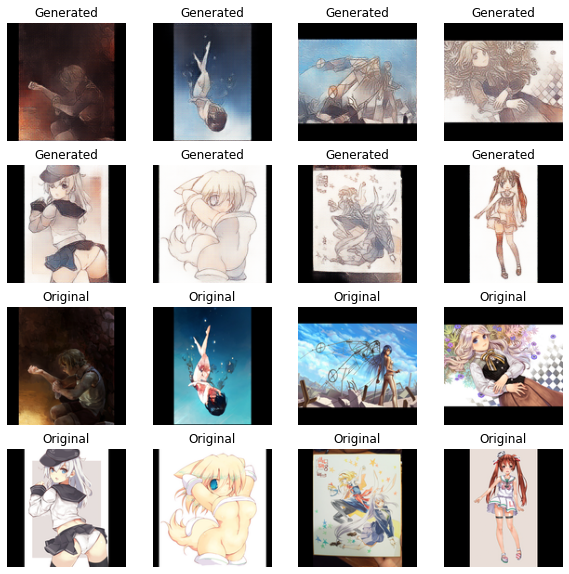

In [23]:
train(g_model, d_model, gan_model, sketch_path, color_image_path, seed_sketch, seed_color, n_epoch=30, n_batch=288, initial_epoch=20)

epoch>40, 346/346, d_real=0.380, d_fake=0.292, gan=616.741


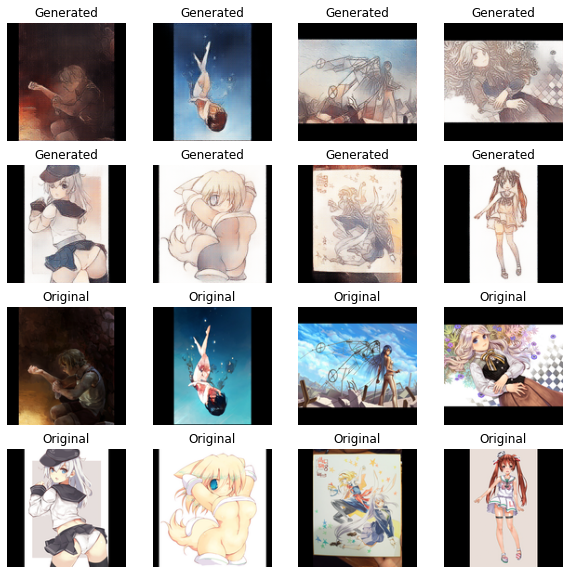

In [24]:
train(g_model, d_model, gan_model, sketch_path, color_image_path, seed_sketch, seed_color, n_epoch=40, n_batch=288, initial_epoch=30)

# Testing on unseen Data

In [20]:

def test_plot(g_model, sketch_img, color_img,img_name):
    '''
    Predict fake images using generator model and plot the [sketch,real,fake] image
    and further saves the figure
    
    '''
    # generating fake images
    fake_col_img = g_model.predict(sketch_img)
    
    # rescaling image [0-1]
    sketch_img = 0.5 * sketch_img + 0.5
    color_img = 0.5 * color_img + 0.5
    fake_col_img = 0.5 * fake_col_img + 0.5
    
    fig, axs = plt.subplots(sketch_img.shape[0], 3, figsize=(.8 * sketch_img.shape[0],5 * sketch_img.shape[0]))
    axs = axs.flatten()
    cnt = 0
    for sketch, real, fake in zip(sketch_img, color_img, fake_col_img):
        axs[cnt].imshow(sketch)
        axs[cnt].set_title('sketch')
        axs[cnt].axis('off')
        
        axs[cnt+1].imshow(real)
        axs[cnt+1].set_title('real_color_image')
        axs[cnt+1].axis('off')
        
        axs[cnt+2].imshow(fake)
        axs[cnt+2].set_title('fake_generated')
        axs[cnt+2].axis('off')
        cnt += 3
    fig.savefig("{}.png".format(img_name))
    plt.subplots_adjust(wspace=.1, hspace=.1)
    plt.show()

In [21]:
!ls "/content/save_model/generator"

generator_0.h5	 generator_19.h5  generator_28.h5  generator_37.h5
generator_10.h5  generator_1.h5   generator_29.h5  generator_38.h5
generator_11.h5  generator_20.h5  generator_2.h5   generator_39.h5
generator_12.h5  generator_21.h5  generator_30.h5  generator_3.h5
generator_13.h5  generator_22.h5  generator_31.h5  generator_4.h5
generator_14.h5  generator_23.h5  generator_32.h5  generator_5.h5
generator_15.h5  generator_24.h5  generator_33.h5  generator_6.h5
generator_16.h5  generator_25.h5  generator_34.h5  generator_7.h5
generator_17.h5  generator_26.h5  generator_35.h5  generator_8.h5
generator_18.h5  generator_27.h5  generator_36.h5  generator_9.h5


In [24]:
# loading unseen test data 
color_img_path = glob.glob('test_set/src/*.png')
sketch_path = glob.glob('test_set/sketch/*.png')

color_img_path = np.array(color_img_path)
sketch_path = np.array(sketch_path)
total_test_img = color_img_path.shape[0]

# randomly taking 20 sketch-color pair from the test set.
index = np.random.randint(0, total_test_img, 20)

In [25]:
total_test_img

6040

In [26]:
def print_test(color_img_path,sketch_path,total_test_img,best_generator,index):
    '''
    Take the random sketch and real image pair and generate the corresponding fake images 
    '''
    # load best generator model
    best_g_model = load_model("save_model/generator/{}".format(best_generator))
    color_img = []
    sketch_img = []
    for sketch, image in zip(sketch_path[index], color_img_path[index]):
        # reading images
        sketch_img.append(np.array(Image.open(sketch).convert('RGB')))
        color_img.append(np.array(Image.open(image).convert('RGB')))

    # normalize [-1,1]
    sketch_img = np.array(sketch_img, dtype='float32')/127.5 - 1
    color_img = np.array(color_img, dtype='float32')/127.5 - 1
    
    # plotting the result
    test_plot(best_g_model,sketch_img,color_img, best_generator.split('.')[0])

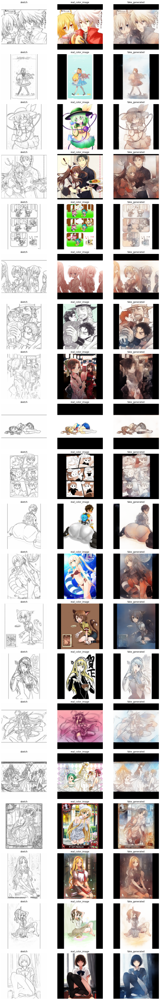

In [37]:
print_test(color_img_path,sketch_path,total_test_img,"generator_39.h5",index)

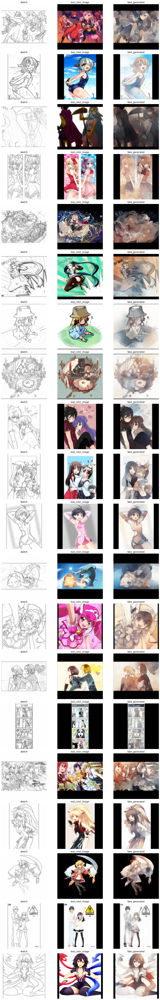

In [27]:
print_test(color_img_path,sketch_path,total_test_img,"generator_39.h5",index)

# Oservation:-

considering, the low quality input image (128x128x3), the results seems Satisified.

-Note :it can be further imporved by running more number of epoches or reducing the batch size and also verifying with metrics like "pixelwise entropy" and "pixelwise accuracy" (Reference: https://www.jeremyjordan.me/semantic-segmentation/#loss )